In [ ]:
!git clone https://github.com/kamiljkon/robustness.git
%cd robustness
!pip install --editable .
!find . -type f -name 'log.txt' -exec sed -i 's/from torch.hub import load_state_dict_from_url/from torch.hub import load_state_dict_from_url/g' {} \;

In [1]:
import shutil
import os

def copy_directory_contents(source, destination):
    """Recursively copy the contents of the source directory to the destination."""
    # Ensure the destination directory exists
    os.makedirs(destination, exist_ok=True)

    # Iterate over all items in the source directory
    for item in os.listdir(source):
        source_item = os.path.join(source, item)
        destination_item = os.path.join(destination, item)

        # Copy directories recursively
        if os.path.isdir(source_item):
            print(f"Copying directory: {source_item}")
            try:
                shutil.copytree(source_item, destination_item)
            except Exception as e:
                print(f"Error copying {source_item} to {destination_item}: {e}")
        # Copy files
        else:
            print(f"Copying file: {source_item}")
            try:
                shutil.copy2(source_item, destination_item)
            except Exception as e:
                print(f"Error copying {source_item} to {destination_item}: {e}")

# Define the source and destination directories
source_dir = 'Neuro140FP/COMPOSITE/dataset'
target_dir = 'robustness/retinalfundus'

# Start the copying process
print("Starting the copying process...")
copy_directory_contents(source_dir, target_dir)
print("Copying process completed.")


Starting the copying process...
Copying directory: Neuro140FP/COMPOSITE/dataset/*
Error copying Neuro140FP/COMPOSITE/dataset/* to robustness/retinalfundus/*: [Errno 17] File exists: 'robustness/retinalfundus/*'
Copying directory: Neuro140FP/COMPOSITE/dataset/train
Error copying Neuro140FP/COMPOSITE/dataset/train to robustness/retinalfundus/train: [Errno 17] File exists: 'robustness/retinalfundus/train'
Copying directory: Neuro140FP/COMPOSITE/dataset/val
Error copying Neuro140FP/COMPOSITE/dataset/val to robustness/retinalfundus/val: [Errno 17] File exists: 'robustness/retinalfundus/val'
Copying process completed.


In [1]:
### DEFINE OUR CUSTOM DATASET IN A WAY COMPATIBLE WITH THE ROBUSTNESS LIB ###

# Note that most of this code is dedicated to defining the transforms inside __init__.
# Another more flexible but more complex strategy can be seen in robustness/datasets.py

import torch as ch
from torchvision import transforms
from robustness.datasets import DataSet
from robustness import imagenet_models
from robustness.data_augmentation import Lighting, IMAGENET_PCA

# Define your custom dataset class
class RetinalFundusDataset(DataSet):
  def __init__(self, data_path='retinalfundus'):

    #### Standard ImageNet transforms ####
    # IMPORTANT: these may or may not make sense for your dataset. for example,
    # check out the default parameters of RandomResizedCrop: https://pytorch.org/vision/main/generated/torchvision.transforms.RandomResizedCrop.html
    transform_train = transforms.Compose([
      transforms.Resize(size=(300,300)),
      transforms.RandomHorizontalFlip(),
      transforms.RandomRotation(10),
      transforms.ToTensor()
    ])

    transform_test = transforms.Compose([
      transforms.Resize(size=(300,300)),
      transforms.ToTensor()
    ])
    ############

    super(RetinalFundusDataset, self).__init__(
      'retinalfundus', data_path, num_classes=2,
      mean=ch.tensor([0.485, 0.456, 0.406]),
      std=ch.tensor([0.229, 0.224, 0.225]),
      custom_class=None, label_mapping=None,
      transform_train=transform_train, transform_test=transform_test
    )

  def get_model(self, arch, pretrained=False):
    return imagenet_models.__dict__[arch](num_classes=self.num_classes, pretrained=pretrained)

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Copied more or less directly from https://robustness.readthedocs.io/en/latest/example_usage/training_lib_part_1.html

from robustness.datasets import DATASETS, ImageNet
from robustness.model_utils import make_and_restore_model
from robustness.train import train_model
from robustness.defaults import check_and_fill_args
from robustness.tools import constants, helpers
from robustness import defaults

from cox import utils
from cox import store

import torch as ch
from argparse import ArgumentParser
import os

/home/u_481835/robustness/robustness/train.py:24: UserWarning: Could not import amp.
  warnings.warn('Could not import amp.')


In [8]:
#### IMPORTANT: these are the main arguments that determine how the model is trained ####
train_kwargs = {
    'dataset': RetinalFundusDataset,
    'arch': 'resnet50',
    'out_dir': "train_out",
    'lr': 0.1,
    'adv_train': 1,
    'constraint': '2',
    'eps': 3,
    'attack_lr': 1.5,
    'attack_steps': 20,
    'epochs': 5,
    'batch_size': 32,  # Possibly helpful specifically for adversarial training: set batch size as high as you can without running out of GPU memory
    'weight_decay': 1e-4,
    'step_lr': 50,
    'workers': 1,
}

# utils.Parameters is just an object wrapper for dicts implementing
# getattr and settattr
args = utils.Parameters(train_kwargs)

In [9]:
# Fill in lots of default arguments. We often use the defaults for ImageNet.
# See robustness/defaults.py for more details.

assert args.dataset is not None, "Must provide a dataset"
ds_class_for_defaults = DATASETS['imagenet'] # Use ImageNet defaults for unspecified training args

args = check_and_fill_args(args, defaults.TRAINING_ARGS, ds_class_for_defaults)
if args.adv_train or args.adv_eval:
  args = check_and_fill_args(args, defaults.PGD_ARGS, ds_class_for_defaults)
args = check_and_fill_args(args, defaults.MODEL_LOADER_ARGS, ds_class_for_defaults)

In [6]:
# Instantiate the dataset
ds = RetinalFundusDataset('robustness/retinalfundus')

# Instantiate the weights
weights = 'Neuro140FP/retfunweights5.pt'

# Make the data loaders
train_loader, val_loader = ds.make_loaders(args.workers,
              args.batch_size, data_aug=bool(args.data_aug))

# Prefetches data to improve performance
train_loader = helpers.DataPrefetcher(train_loader)
val_loader = helpers.DataPrefetcher(val_loader)

import torch
from robustness.model_utils import make_and_restore_model
import torch.nn as nn

# Assuming you've loaded the dataset 'ds' correctly

# Load the checkpoint correctly as a state dictionary
state_dict = torch.load(weights, map_location='cpu')

# Check if the loaded state dict is actually a dictionary
if isinstance(state_dict, dict):
    # Initialize the model
    model, _ = make_and_restore_model(arch='resnet50', dataset=ds, add_custom_forward=True)
    model.model.fc = nn.Linear(in_features=2048, out_features=ds.num_classes, bias=True)

    # Apply the loaded weights directly to the model
    model.load_state_dict(state_dict, strict=False)  # 'strict=False' allows ignoring non-matching keys
    print("State dictionary loaded successfully into the model.")
else:
    print("Loaded data is not a dictionary.", type(state_dict))


==> Preparing dataset retinalfundus..
State dictionary loaded successfully into the model.


In [10]:
# Create the cox store, and save the arguments in a table
my_store = store.Store(args.out_dir, args.exp_name)
args_dict = args.as_dict() if isinstance(args, utils.Parameters) else vars(args)
schema = store.schema_from_dict(args_dict)
my_store.add_table('metadata', schema)
my_store['metadata'].append_row(args_dict)

Logging in: /home/u_481835/train_out/6cb21125-de19-41e3-a602-b041fa09a4e3


In [11]:
# Train the model!
# Note that it evaluates on the "val" set twice for each epoch: once to get
# clean accuracy (NatPrec1), and once to get accuracy on adversarial examples (AdvPrec1)
# With the default 5 epochs at lr=0.01 on the Hymenoptera dataset, it tends to not learn anything -
# this is just intended as an example to show how to get a model training.

model = train_model(args, model, (train_loader, val_loader), store=my_store)

Train Epoch:0 | Loss 1.2620 | AdvPrec1 56.336 | AdvPrec5 100.000 | Reg term: 0.0 ||: 100%|██████████| 485/485 [59:21<00:00,  7.34s/it] 
Val Epoch:0 | Loss 0.7232 | NatPrec1 58.972 | NatPrec5 100.000 | Reg term: 0.0 ||: 100%|██████████| 122/122 [05:05<00:00,  2.50s/it]
Val Epoch:0 | Loss 0.7729 | AdvPrec1 58.972 | AdvPrec5 100.000 | Reg term: 0.0 ||: 100%|██████████| 122/122 [14:11<00:00,  6.98s/it]
Train Epoch:1 | Loss 0.6905 | AdvPrec1 58.208 | AdvPrec5 100.000 | Reg term: 0.0 ||: 100%|██████████| 485/485 [59:21<00:00,  7.34s/it]
Train Epoch:2 | Loss 0.6836 | AdvPrec1 58.679 | AdvPrec5 100.000 | Reg term: 0.0 ||: 100%|██████████| 485/485 [59:06<00:00,  7.31s/it]
Train Epoch:3 | Loss 0.6807 | AdvPrec1 58.776 | AdvPrec5 100.000 | Reg term: 0.0 ||: 100%|██████████| 485/485 [58:50<00:00,  7.28s/it]
Train Epoch:4 | Loss 0.6810 | AdvPrec1 58.757 | AdvPrec5 100.000 | Reg term: 0.0 ||: 100%|██████████| 485/485 [59:06<00:00,  7.31s/it]
Val Epoch:4 | Loss 0.7172 | NatPrec1 58.198 | NatPrec5 100

==> Preparing dataset retinalfundus..


Current loss: 0.9345234036445618: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]


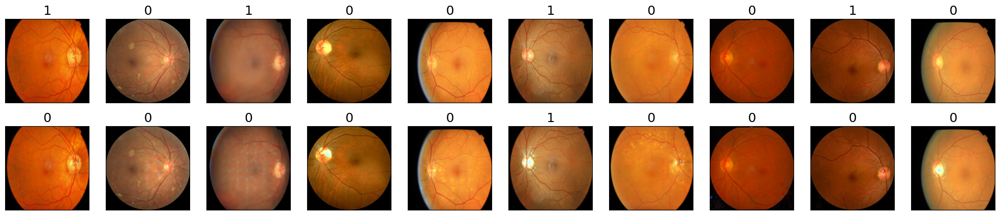

==> Preparing dataset retinalfundus..


Current loss: 0.9118470549583435: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]


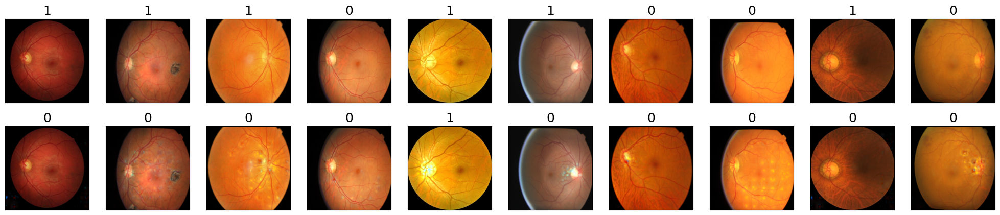

==> Preparing dataset retinalfundus..


Current loss: 0.9125097393989563: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]


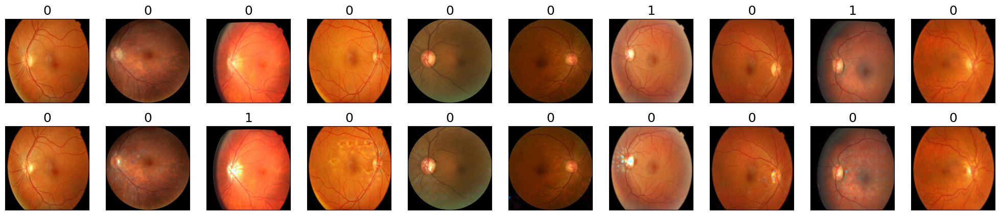

==> Preparing dataset retinalfundus..


Current loss: 0.7984936237335205: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]


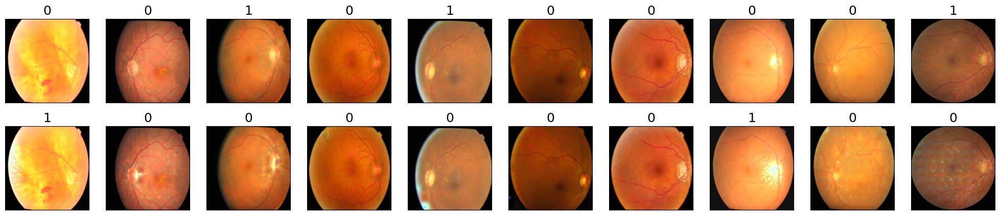

==> Preparing dataset retinalfundus..


Current loss: 0.6733309030532837: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]


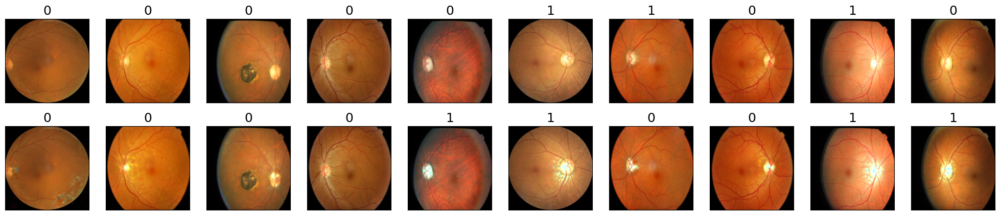

==> Preparing dataset retinalfundus..


Current loss: 0.7356836199760437: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]


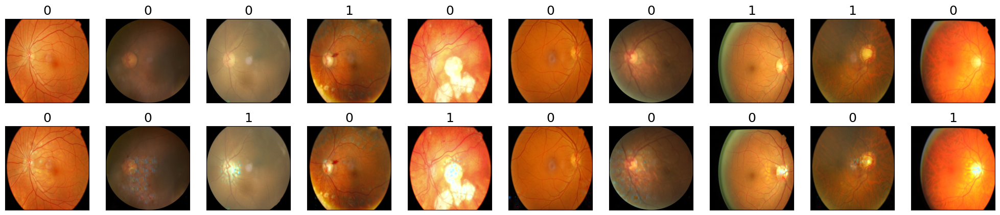

==> Preparing dataset retinalfundus..


Current loss: 0.9525365233421326: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]


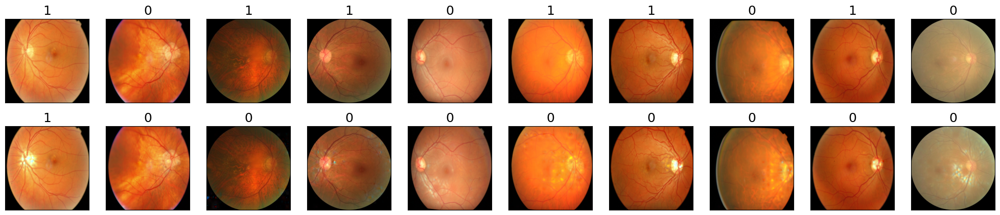

==> Preparing dataset retinalfundus..


Current loss: 0.6945139169692993: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]


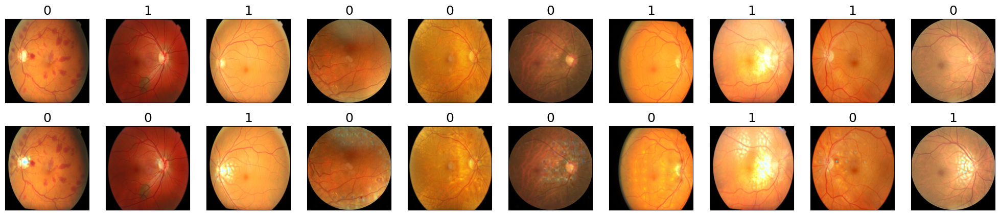

==> Preparing dataset retinalfundus..


Current loss: 0.9244341850280762: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]


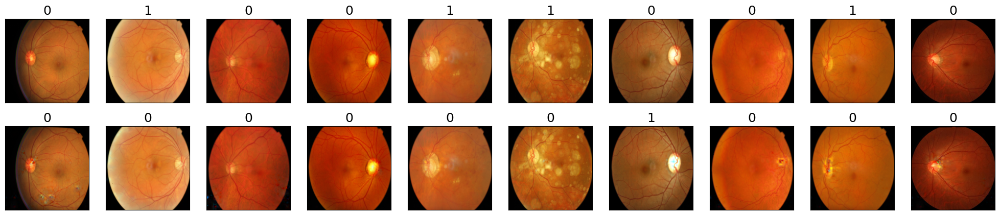

==> Preparing dataset retinalfundus..


Current loss: 0.70097416639328: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]  


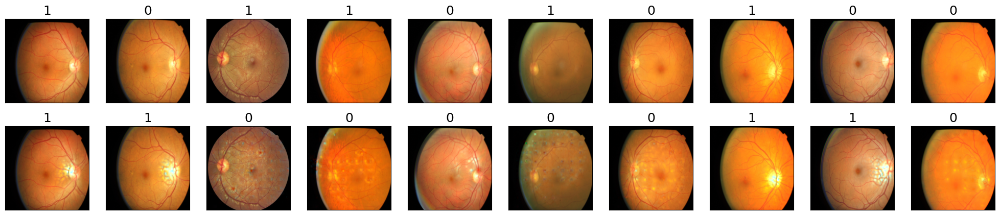

==> Preparing dataset retinalfundus..


Current loss: 0.767315685749054: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s] 


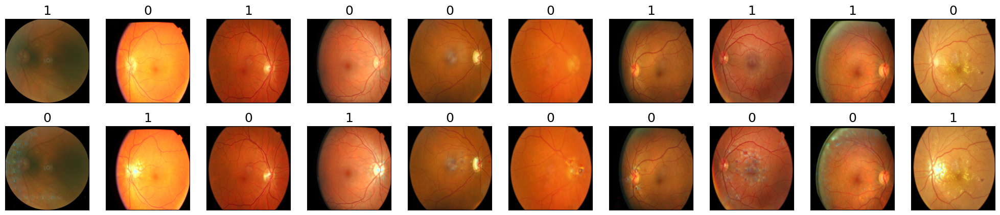

==> Preparing dataset retinalfundus..


Current loss: 0.79740309715271: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]  


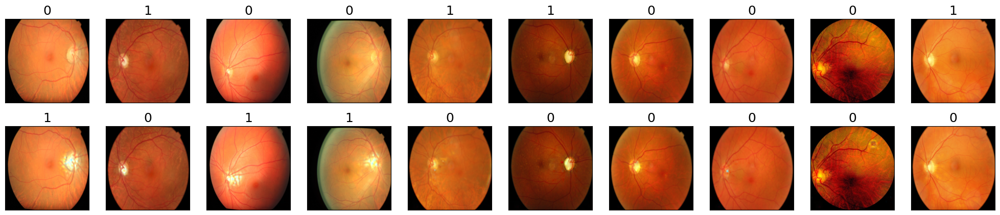

==> Preparing dataset retinalfundus..


Current loss: 0.9020102620124817: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]


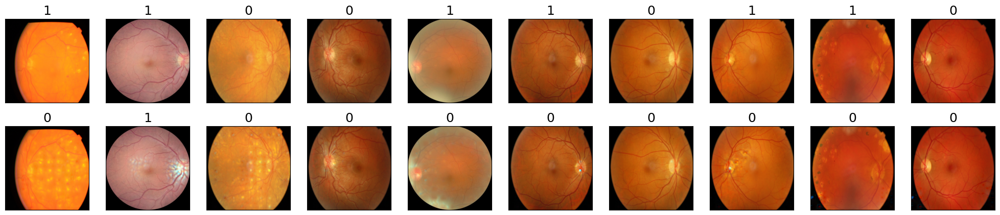

==> Preparing dataset retinalfundus..


Current loss: 0.8138543367385864: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]


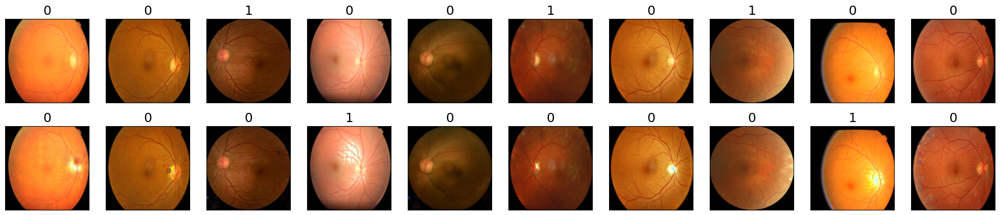

==> Preparing dataset retinalfundus..


Current loss: 0.8988195657730103: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]


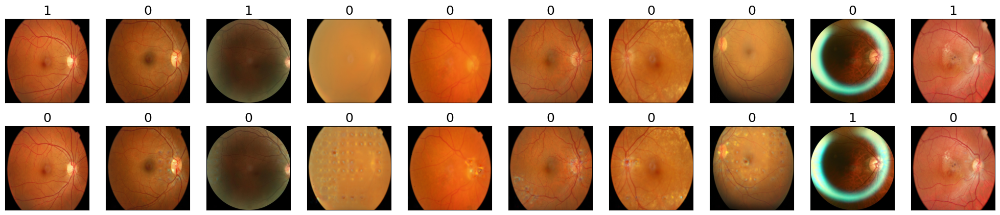

==> Preparing dataset retinalfundus..


Current loss: 0.8610011339187622: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]


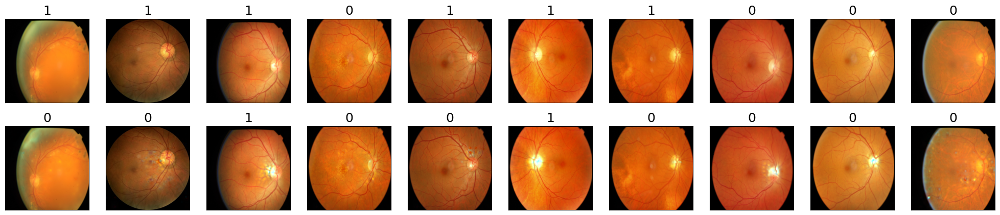

==> Preparing dataset retinalfundus..


Current loss: 0.7861563563346863: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]


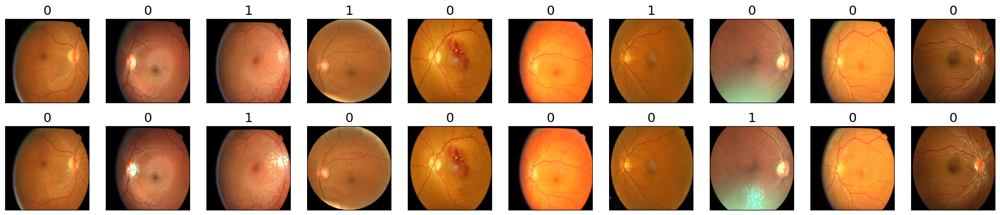

==> Preparing dataset retinalfundus..


Current loss: 0.7307295799255371: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]


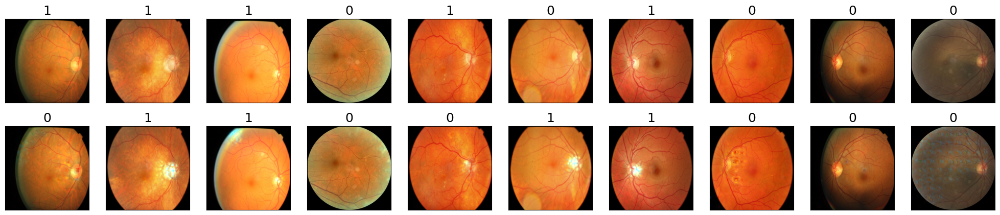

==> Preparing dataset retinalfundus..


In [ ]:
from robustness.tools.vis_tools import show_image_row
from robustness.tools.label_maps import CLASS_DICT

for i in range(29, 50):
    ATTACK_EPS = 30
    ATTACK_STEPSIZE = 0.5
    ATTACK_STEPS = 50
    NUM_WORKERS = 2
    BATCH_SIZE = 10
    
    kwargs = {
        'constraint':'2',
        'eps': ATTACK_EPS,
        'step_size': ATTACK_STEPSIZE,
        'iterations': ATTACK_STEPS,
        'targeted': True,
        'do_tqdm': True
    }
    
    train_loader, val_loader = ds.make_loaders(NUM_WORKERS, BATCH_SIZE, data_aug=False)
    
    device = ch.device("cuda" if ch.cuda.is_available() else "cpu")
    _, (im, label) = next(enumerate(val_loader))
    im = im.to(device)
    label = label.to(device)
    
    # Make everything look like class "1" (bees). Images that are already bees
    # will be enhanced, while ant images will be made to look more like bees
    target_class = 1
    targ = target_class * ch.ones_like(label)
    
    _, im_adv = model(im, targ, make_adv=True, **kwargs)
    
    # Get predicted labels for adversarial examples
    pred, _ = model(im_adv)
    label_pred = ch.argmax(pred, dim=1)
    
    # Visualize test set images, along with corresponding adversarial examples
    
    show_image_row([im.cpu(), im_adv.cpu()],
             tlist=[[int(t) for t in l] for l in [label, label_pred]],
             fontsize=18,
             filename=f'Neuro140FP/advimages/{i}.png')